# Практическая работа №8. Прогнозирование вероятности оформления срочного вклада

<a id=content></a>
## Содержание

<br>[Описание проекта](#descr_proj)
<br>[Описание данных](#descr_data)
<br>
1. [<b>Загрузка данных и получение общей информации</b>](#1)
2. [<b>Предварительная обработка данных</b>](#2)
    <br>[2.1. Обработка дубликатов](#2.1.)
    <br>[2.2. Обработка смысловых значений](#2.2.)
    <br>[2.3. Изменение пропущенных значений](#2.3.)
3. [<b>Исследовательский анализ данных</b>](#3)
    <br>[3.1. Каков средний возраст незамужних/холостых клиентов? Постройте `boxplot`.](#3.1.)
    <br>[3.2. В какой день недели  чаще всего звонили клиентам, отказавшимся от срочного вклада? Постройте `столбчатую диаграмму`.](#3.2.)
    <br>[3.3. Постройте график по признакам `Семейный статус` и `y`. Какие выводы можно сделать?](#3.3.)
    <br>[3.4. Имеется ли связь между `просрочкой кредита` у клиента и результатом `y`? Постройте `диаграмму рессеяния`.](#3.4.)
    <br>[3.5. Визуализируйте информацию об уровне `образования` в зависимости от среднего `возраста`. Есть ли статистически значимая взаимосвязь между ними?](#3.5.)
    <br>[3.6. Что можно сказать о связи между `длительностью` контакта и `возрастом` клиента? Найдите коэффициент корреляции.](#3.6.)
    <br>[3.7. Как связаны признаки `образование` и `ипотека`?](#3.7.)
4. [<b>Постройте прогнозную модель вероятности оформления срочного вклада клиентом</b>](#4)
    <br>[4.1. Подготовка данных и определение признаков](#3.1.)
    <br>[4.2. Разделение на `train` / `test`](#3.2.)
    <br>[4.3. Предобработка и построение модели](#3.3.)
    <br>[4.4. Обучение модели](#4.4.)
    <br>[4.5. Оценка качества модели](#4.5.)
    <br>[4.6. Матрица ошибок](#4.6.)
    <br>[4.7. Градация важности признаков](#4.7.)
    <br>[4.8. Пример прогнозирования оформления срочного вклада новым клиентом](#4.8.)
5. [<b>Вывод</b>](#5)

<a id=descr_proj></a>
## Описание проекта

Необходимо выполнить разведочный анализ данных по пунктам, предложенным ниже, а также построить прогнозную модель вероятности оформления срочного вклада новым клиентом.

<a id=descr_data></a>
## Описание данных
Исходный датафрейм содержит информацию в количестве 41 188 срок по 20 столбцам со следующими значениями:

|№ п/п| Наименование признака | Краткое описание                                       | Единицы измерения | Значение |
|---|:------------------------|:-------------------------------------------------------|:------------------|:---------|
|1. |`Возраст` |возраст клинта банка| 78 уникальных значений возраста в количестве полных лет | от 17 до 98|
|2. |`Работа` | форма трудовой занятости клиеннта | 11 уникальных наименований форм трудовой занятости | `Самозанятый`, `Преддприниматель`, `Голубой воротничок`, `Менеджер`, `Техник`, `Студент`, `Домохозяйка`, `Обслуживающий персонал`, `Пенсионер`, `Cамозанятый`, **`Неизвестно`**| 
|3. |`Семейный статус` | форма семейного статуса клиента | 4 уникальных наименований форм трудовой занятости | `Не женат / не замужем`, `Женат / замужем`, `Разведен(-а)`, **`Неизвестно`**| 
|4. |`Образование` | полученный клиентом вид образования | 8 уникальных наименований | `Неграмотный`, `Базовое (4 класса)`, `Базовое (6 классов)`, `Базовое (9 классов)`, `Высшая школа`, `Профессиональный курс`, `Университетская степень`, **`Неизвестно`**| 
|5. |`Кредитный дефолт` | Невыполннение клиентом-заёмщиком обязательств по кредиту в соответствии с условиями договора | 3 уникальных наименования | `Да`, `Нет`, **`Неизвестно`** | 
|6. |`Ипотека` | Наличие либо отсутствие ипотеки у клиента | 3 уникальных наименования  | `Да`, `Нет`, **`Неизвестно`**| 
|7. |`Займ` | Наличие либо отсутствие займа у клиента | 3 уникальных наименования | `Нет`, `Да`, **`Неизвестно`**| 
|8. |`Контакт` | Вид контакта клиента для связи | 2 уникальные формы контакта | `Городской телефон`, `Сотовый телефон`| 
|9. |`Месяц` | Месяц последнего контакта в году  | 10 уникальных наименований  | `Март`, `Апрель`, `Май`, `Июнь`, `Июль`, `Август`, `Сентябрь`, `Октябрь`, `Ноябрь`, `Декабрь`| 
|10. |`День недели` | День недели последнего контакта в году | 5 уникальных наименований  | `Понедельник`, `Вторник`, `Среда`, `Четверг`, `Пятница`| 
|11. |`Длительность` | Длительность последнего контакта в году в секундах | длительность в секундах | от 0 до 4 918| 
|12. |`Кампания` | Количество контактов, выполненных во время этой кампании и для этого клиента, в том числе последний контакт | 42 уникальных количественных значения | от 1 до 56| 
|13. |`День` | Количество дней, прошедших с момента последнего контакта с клиентом из предыдущей кампании, при этом 999 означает, что с клиентом ранее не связывались | 27 уникальных количественных значений | от 0 до 26, а тажке спецкод `999`| 
|14. |`Предыдущий контакт` | Количество контактов, выполненных до этой кампании и для этого клиента | 8 уникальных значений по контактам с клиентом| от 0 до 7| 
|15. |`Доходность` | Результат предыдущей маркетинговой кампании | 3 уникальных результата | `Присутствует`, `Не присутствует`, `Отсутствует`| 
|16. |`Колебание уровня безработицы` | Квартальный показатель  | 10 уникальных количественных значений | от -3.4 до 1.4| 
|17. |`Индекс потребительских цен` | Ежемесячный показатель | 26 уникальных количественных значений | от 92.201 до 94.767| 
|18. |`Индекс потребительской уверенности` | Ежемесячный показатель | 26 уникальных количественных значений | от -50.8 до -26.9| 
|19. |`Европейская межбанковская ставка` | Ежедневный показатель | 316 уникальных количественных значений | от 0.634 до 5.045| 
|20. |`Количество сотрудников в компании ` | Квартальный показатель | 11 уникальных количественных значений | от 4963.6 до 5228.1| 
|21. |`y` | Оформление клиентом срочного вклада | целевой булев признак | да / нет | 

Все данные получены последовательным применением методов `len()`, `unique()`, `nunique()`, `min()`, `max()`.

<a id=1></a>
## Шаг 1. Загрузка данных и получение общей информации

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# обработка пропущенных значений
from sklearn.impute import SimpleImputer 

# расчёт корреляции и выявление взаимосвязи между признаками
from scipy.stats import pearsonr, spearmanr 
from scipy.stats import chi2_contingency
from scipy.stats import shapiro, levene, f_oneway, kruskal

# библиотеки для создания прогнозной модели
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# метрики качества прогнозной модели
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_curve

%matplotlib inline

import warnings
warnings.simplefilter('ignore')

# графики в svg выглядят более чёткими
%config InlineBackend.figure_format='svg'

# увеличим исходный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 6, 4
sns.set_style('whitegrid', {'axes.grid':True})

In [2]:
# импорт данных
df = pd.read_csv('tgu_8_bank.csv', sep=';')
df.head()

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,...,Кампания,День,Предыдущий контакт,Доходность,Колебание уровня безработицы,Индекс потребительских цен,Индекс потребительской уверенности,Европейская межбанковская ставка,Количество сотрудников в компании,y
0,27,Самозанятый,Не женат / не замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Нет
1,30,Преддприниматель,Женат / замужем,Университетская степень,Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
2,39,Голубой воротничок,Женат / замужем,Базовое (9 классов),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
3,42,Менеджер,Женат / замужем,Высшая школа,Нет,Да,Да,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да
4,42,Самозанятый,Женат / замужем,Базовое (4 класса),Нет,Нет,Нет,Городской телефон,Октябрь,Пятница,...,1,999,0,Отсутствует,-0.1,93.798,-40.4,5.045,5195.8,Да


In [3]:
# получение общей информации о датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Возраст                             41188 non-null  int64  
 1   Работа                              41188 non-null  object 
 2   Семейный статус                     41188 non-null  object 
 3   Образование                         41188 non-null  object 
 4   Кредитный дефолт                    41188 non-null  object 
 5   Ипотека                             41188 non-null  object 
 6   Займ                                41188 non-null  object 
 7   Контакт                             41188 non-null  object 
 8   Месяц                               41188 non-null  object 
 9   День недели                         41188 non-null  object 
 10  Длительность                        41188 non-null  int64  
 11  Кампания                            41188

**Вывод:** На первый взгляд в дата сете по банковским операциям все строки заполнены, нулевых значений нет. Проверим датасет на наличие дубликатов и уникальность контента ячеек.

<a id=2></a>
## Шаг 2. Предварительная обработка данных

<a id=2.1.></a>
### 2.1. Обработка дубликатов 

In [4]:
# расчёт количества полных дубликатов
df.duplicated().sum()

np.int64(12)

In [5]:
# удаление полных дубликатов
df = df.drop_duplicates()

In [6]:
# проверка результатов преобразования
df.shape

(41176, 21)

<a id=2.2.></a>
### 2.2. Обработка смысловых значений

In [7]:
# замена смасловых значений
df = df.replace({'Работа': {'Самозанятый': 'Самозанятый',   # латинская C
                           'Cамозанятый': 'Самозанятый',   # русская С
                           'Голубой воротничок': 'Рабочий',
                           'Преддприниматель': 'Предприниматель'}})

df = df.replace({'Образование': {'Высшая школа': 'Старшая школа'}})
df = df.replace({'Кредитный дефолт': {'Нет': 0, 'Да': 1}})
df = df.replace({'Ипотека': {'Нет': 0, 'Да': 1}})
df = df.replace({'Займ': {'Нет': 0, 'Да': 1}})
df = df.replace({'Доходность': {'Отсутствует': 0, 'Присутствует': 1, 'Не присутствует': 0}})
df = df.replace({'y': {'Нет': 0, 'Да': 1}})

In [8]:
# проверка результатов преобразования
df.head()

,Возраст,Работа,Семейный статус,Образование,Кредитный дефолт,Ипотека,Займ,Контакт,Месяц,День недели,...,Кампания,День,Предыдущий контакт,Доходность,Колебание уровня безработицы,Индекс потребительских цен,Индекс потребительской уверенности,Европейская межбанковская ставка,Количество сотрудников в компании,y
0,27,Самозанятый,Не женат / не замужем,Университетская степень,0,0,0,Городской телефон,Октябрь,Пятница,...,1,999,0,0,-0.1,93.798,-40.4,5.045,5195.8,0
1,30,Предприниматель,Женат / замужем,Университетская степень,0,0,0,Городской телефон,Октябрь,Пятница,...,1,999,0,0,-0.1,93.798,-40.4,5.045,5195.8,1
2,39,Рабочий,Женат / замужем,Базовое (9 классов),0,0,0,Городской телефон,Октябрь,Пятница,...,1,999,0,0,-0.1,93.798,-40.4,5.045,5195.8,1
3,42,Менеджер,Женат / замужем,Старшая школа,0,1,1,Городской телефон,Октябрь,Пятница,...,1,999,0,0,-0.1,93.798,-40.4,5.045,5195.8,1
4,42,Самозанятый,Женат / замужем,Базовое (4 класса),0,0,0,Городской телефон,Октябрь,Пятница,...,1,999,0,0,-0.1,93.798,-40.4,5.045,5195.8,1


<a id=2.3.></a>
### 2.3. Обработка пропущенных значений

In [9]:
# заполнение пропусков
categorical_values = df[['Работа', 'Семейный статус', 
                         'Образование', 'Контакт', 'Месяц', 
                         'День недели', 'Доходность']].values.ravel()
unique_values =  pd.unique(categorical_values)
unique_values

array(['Самозанятый', 'Не женат / не замужем', 'Университетская степень',
       'Городской телефон', 'Октябрь', 'Пятница', 0, 'Предприниматель',
       'Женат / замужем', 'Рабочий', 'Базовое (9 классов)', 'Менеджер',
       'Старшая школа', 'Базовое (4 класса)', 'Техник',
       'Профессиональный курс', 'Разведен(-а)', 'Неизвестно',
       'Сотовый телефон', 'Август', 'Понедельник', 'Студент',
       'Домохозяйка', 'Обслуживающий персонал', 'Базовое (6 классов)',
       'Пенсионер', 'Четверг', 'Вторник', 'Июль', 'Среда', 'Июнь',
       'Неграмотный', 'Май', 'Ноябрь', 1, 'Декабрь', 'Март', 'Апрель',
       'Сентябрь'], dtype=object)

In [10]:
# замена пропущенных значений
df['Работа'] = df['Работа'].replace('Неизвестно', np.nan)
df['Семейный статус'] = df['Семейный статус'].replace('Неизвестно', np.nan)
df['Образование'] = df['Образование'].replace('Неизвестно', np.nan)
df['Месяц'] = df['Месяц'].replace('Неизвестно', np.nan)
df['День недели'] = df['День недели'].replace('Неизвестно', np.nan)
df['Доходность'] = df['Доходность'].replace('Не присутствует', np.nan)
df['Кредитный дефолт'] = df['Кредитный дефолт'].replace('Неизвестно', np.nan)
df['Ипотека'] = df['Ипотека'].replace('Неизвестно', np.nan)
df['Займ'] = df['Займ'].replace('Неизвестно', np.nan)
df['День'] = df['День'].replace(999, np.nan)

In [11]:
# преобразование типов данных из float в integer
df['Кредитный дефолт'] = df['Кредитный дефолт'].astype('Int64') # преобразования с учётом пропусков
df['Ипотека'] = df['Ипотека'].astype('Int64')
df['Займ'] = df['Займ'].astype('Int64')

In [12]:
# проверка результатов заполнения
df.isnull().sum()

Возраст                                   0
Работа                                  330
Семейный статус                          80
Образование                            1730
Кредитный дефолт                       8596
Ипотека                                 990
Займ                                    990
Контакт                                   0
Месяц                                     0
День недели                               0
Длительность                              0
Кампания                                  0
День                                  39661
Предыдущий контакт                        0
Доходность                                0
Колебание уровня безработицы              0
Индекс потребительских цен                0
Индекс потребительской уверенности        0
Европейская межбанковская ставка          0
Количество сотрудников в компании         0
y                                         0
dtype: int64

Из общего числа строк 41 176 мы видим, что имеются пропущенные значения в столбцах: `Работа` - 330 ед., `Семейный статус` - 80 ед., `Образование` - 1730 ед., `Кредитный дефолт` - 8596 ед., `Ипотека` - 990 ед., `Займ` - 990 ед., `День` - 39 661 ед. Максимальное и недопустимое для дальнейшего исследования количество пропусков содержится в столбце `День`, таких записей 39 661 из 41 176. Пропуски по этому признаку не подлежат заполнению медианным или средним значением, а такжке посредством логических условий. Поэтому, мы удаляем этот столбец из датасета.

In [13]:
# удаление столбца `День`
df = df.drop(columns=['День'])

In [14]:
# заполним значения наиболее часто встречающимися повторениями (по типу мода)
imputer = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')

for col in ['Работа', 'Семейный статус', 'Образование', 'Месяц',
            'День недели', 'Доходность', 'Кредитный дефолт', 'Ипотека', 'Займ']:
    df[[col]] = imputer.fit_transform(df[[col]])

In [15]:
# проверка результатов заполнения пропусков
df.isnull().sum()

Возраст                               0
Работа                                0
Семейный статус                       0
Образование                           0
Кредитный дефолт                      0
Ипотека                               0
Займ                                  0
Контакт                               0
Месяц                                 0
День недели                           0
Длительность                          0
Кампания                              0
Предыдущий контакт                    0
Доходность                            0
Колебание уровня безработицы          0
Индекс потребительских цен            0
Индекс потребительской уверенности    0
Европейская межбанковская ставка      0
Количество сотрудников в компании     0
y                                     0
dtype: int64

<a id=3></a>
## Шаг 3. Исследовательский анализ данных

<a id=3.1.></a>
### 3.1. Каков средний возраст незамужних/холостых клиентов? Постройте `boxplot`.

In [16]:
# посчитаем средний возраст незамужних/холостых клиентов
df.loc[df['Семейный статус'] == 'Не женат / не замужем', 'Возраст'].mean()

np.float64(33.156866136285025)

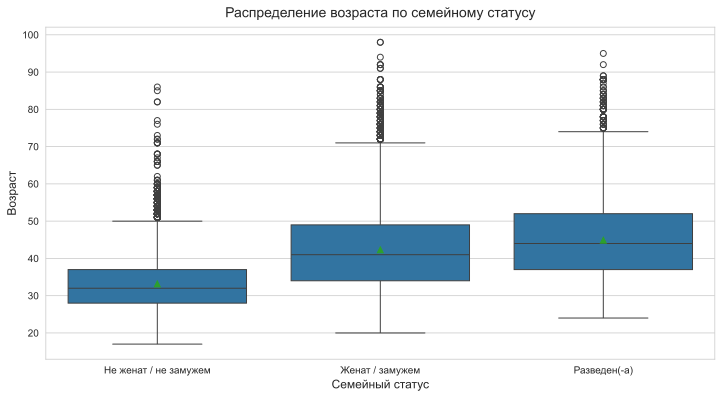

In [17]:
# визуализация: диаграмма размаха
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Семейный статус', y='Возраст', showmeans=True)
plt.xlabel('Семейный статус', fontsize=12)
plt.ylabel('Возраст', fontsize=12)
plt.title('Распределение возраста по семейному статусу', fontsize=14, pad=10)
plt.xticks(rotation=0)
plt.show()

**Вывод:** средний возраст незамужних/холостых клиентов составляет 33 года.

<a id=3.2.></a>
### 3.2. В какой день недели чаще всего звонили клиентам, отказавшимся от срочного вклада? Постройте `столбчатую диаграмму`.

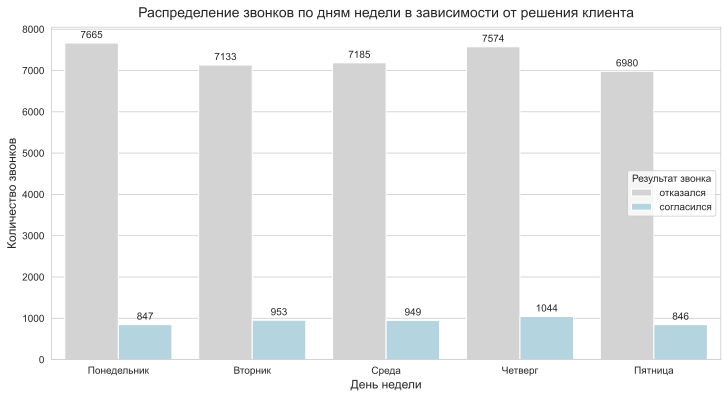

In [18]:
# выстроим дни недели в логическом порядке
day_order = ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница']

# визуализация: столбчатая диаграмма
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=df, x='День недели', hue='y', palette=['lightgrey', 'lightblue'], order=day_order)

# замена подписей легенды
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['отказался', 'согласился'], title='Результат звонка') # 0 — отказался, 1 — согласился

# добавление числовых значений над столбцами
for container in ax.containers:
    ax.bar_label(container, fmt='%d', padding=3)

# подписи осей и заголовок
plt.xlabel('День недели', fontsize=12)
plt.ylabel('Количество звонков', fontsize=12)
plt.title('Распределение звонков по дням недели в зависимости от решения клиента', fontsize=14, pad=10)
plt.show()

**Вывод:** на диаграмме мы видим, что чаще всего клиентам, отказавшимся от срочного вклада, звонили в понедельник. Следующий по значимости день - четверг. Одновременно с этим, четверг является самым результативным днём для подключения услуги срочного вклада в банке.

<a id=3.3.></a>
### 3.3. Постройте график по признакам `Семейный статус` и `y`. Какие выводы можно сделать?

In [19]:
# абсолютные значения
abs_freq = df.groupby('Семейный статус')['y'].value_counts().unstack(fill_value=0).rename(columns={0: 'нет срочного вклада', 1: 'есть срочный вклад'})
# относительные значения (%)
rel_freq = df.groupby('Семейный статус')['y'].value_counts(normalize=True).unstack(fill_value=0).rename(columns={0: 'нет срочного вклада_%', 1: 'есть срочный вклад_%'}) * 100

# округляем проценты
rel_freq = rel_freq.round(2)

# объединяем в один датафрейм
result_df = pd.concat([abs_freq, rel_freq], axis=1)

# упорядочиваем столбцы
result_df = result_df[['есть срочный вклад', 'есть срочный вклад_%', 'нет срочного вклада', 'нет срочного вклада_%']]
result_df.index.name = 'Семейный статус'
result_df.reset_index(inplace=True)  # делаем 'Семейный статус' обычным столбцом
result_df

y,Семейный статус,есть срочный вклад,есть срочный вклад_%,нет срочного вклада,нет срочного вклада_%
0,Женат / замужем,2543,10.17,22458,89.83
1,Не женат / не замужем,1620,14.01,9944,85.99
2,Разведен(-а),476,10.32,4135,89.68


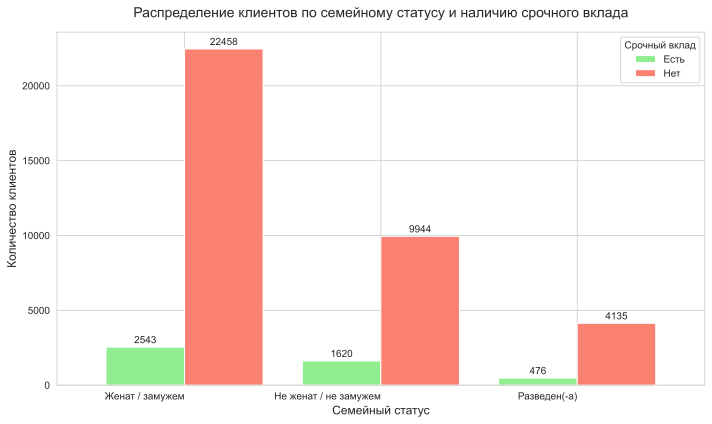

In [20]:
# подготовка данных для графика (только абсолютные значения)
plot_data = result_df.set_index('Семейный статус')[['есть срочный вклад', 'нет срочного вклада']]
ax = plot_data.plot(kind='bar', figsize=(10, 6), color=['lightgreen', 'salmon'], width=0.8)
plt.title('Распределение клиентов по семейному статусу и наличию срочного вклада', fontsize=14, pad=15)
plt.xlabel('Семейный статус', fontsize=12)
plt.ylabel('Количество клиентов', fontsize=12)
plt.xticks(rotation=0, ha='right')
plt.legend(title='Срочный вклад', labels=['Есть', 'Нет'])
plt.tight_layout()

for container in ax.containers:
    ax.bar_label(container, label_type='edge', padding=2)

plt.show()

**Вывод:** Лидирующей по численности категорией граждан, которые открыли срочный вклад в банке, являются семейные пары. Пожалуй, здесь также можно рассуждать и о некоторой финансовой стабильности внутри отдельно взятой ячейки общества, которая позволяет людям более свободно оперировать денежными средствами и пользоваться банковскими услугами. Следующей по значимости категорией граждан, открывших срочный вклад, являются незамужние/холостые люди. Категория разведённых граждан является самой сложной.

<a id=3.4.></a>
### 3.4. Имеется ли связь между `просрочкой кредита` у клиента и результатом `y`? Постройте `диаграмму рессеяния`.

In [21]:
# добавляем небольшой шум `jitter` в существующие данные
x_jitter = df['Кредитный дефолт'] + np.random.normal(0, 0.05, size=len(df['Кредитный дефолт']))
y_jitter = df['y'] + np.random.normal(0, 0.05, size=len(df['y']))

# визуализация
plt.figure(figsize=(6, 6))
plt.scatter(x_jitter, y_jitter, alpha=0.5, color='#FFB700', edgecolor='k', linewidth=0.3)
plt.xticks([0, 1])
plt.yticks([0, 1])
plt.xlabel('Просрочка выплаты кредита')
plt.ylabel('Оформление кредитного займа')
plt.title('Диаграмма рассеяния с jitter для бинарных данных по оформлению кредита и просрочке его выплаты')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

In [22]:
# таблица сопряжённости 2x2
crosstab = pd.crosstab(df['Кредитный дефолт'], df['y'])
print('Таблица сопряжённости')
crosstab

Таблица сопряжённости


y,0,1
Кредитный дефолт,,
0.0,36534,4639
1.0,3,0


In [23]:
# тест хи-квадрат
chi2, p, dof, expected = chi2_contingency(crosstab, correction=False)  # без поправки Йейтса

# общее число наблюдений
n = crosstab.sum().sum()

# коэффициент фи
phi = np.sqrt(chi2 / n)

print(f"\nХи-квадрат: {chi2:.4f}")
print(f"p-значение: {p:.4f}")
print(f"Коэффициент фи (φ): {phi:.4f}")


Хи-квадрат: 0.3809
p-значение: 0.5371
Коэффициент фи (φ): 0.0030


**Вывод:** коэффициент φ принимает значения от 0 до 1 (в случае бинарных переменных — всегда неотрицательный по модулю), где значение φ:
<br>0.00 – 0.10 это очень слабая или отсутствующая связь
<br>0.10 – 0.30 это слабая связь
<br>0.30 – 0.50 это умеренная связь
<br>> 0.50 это сильная связь

Полученное нами значение φ `0.0030` находится в самом начале шкалы, что означает отсутствие статистически значимой ассоциации между просрочкой выплаты кредита и целевой переменной y (оформление кредитного займа). Таким образом, знание того, был ли у клиента кредитный дефолт, не помогает предсказать его поведение по оформлению кредитного займа. Эти два признака можно считать независимыми в рамках нашего исследования.
<br> При построении прогнозной модели для целевого признка `y` признак `Кредитный дефолт` не внесёт полезной информации и может быть исключен из исследования без потери качества.

<a id=3.5.></a>
### 3.5. Визуализируйте информацию об уровне `образования` в зависимости от среднего `возраста`. Есть ли статистически значимая взаимосвязь между ними?

Чтобы оценить статистическую взаимосвязь между категориальной переменной (`уровень образования`) и непрерывной переменной (`возраст`), нужно проверить, отличаются ли распределения возраста в группах с разным уровнем образования. Поскольку типы переменных разные, корреляция Пирсона не подходит. Вместо этого применяются непараметрические или параметрические тесты для сравнения групп.

Сформулируем гипотезы:
$$
\begin{equation*}
 \begin{cases}
   \text{H}_0 \text{ : возрастные распределения одинаковы во всех группах образования}
   \\
   \text{H}_1 \text{ : хотя бы в одной группе распределение возраста отличается}
   \\
 \end{cases}
\end{equation*}
$$

Установим пороговое значение: $ \alpha = 0.05$


In [24]:
# описательные статистики, а также расчёт медианы и IQR по видам образования
summary = df.groupby('Образование')['Возраст'].agg(
    ['count', 'median', 'mean', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
).round(1)
summary.columns = ['Всего', 'Медиана', 'Среднее', 'Q1', 'Q3']
summary.sort_values('Медиана')

,Всего,Медиана,Среднее,Q1,Q3
Образование,,,,,
Старшая школа,9512,36.0,38.0,31.0,44.0
Университетская степень,13894,37.0,39.5,32.0,46.0
Базовое (9 классов),6045,38.0,39.1,32.0,46.0
Профессиональный курс,5240,38.0,40.1,33.0,47.0
Базовое (6 классов),2291,39.0,40.4,34.0,46.0
Базовое (4 класса),4176,47.0,47.6,39.0,55.0
Неграмотный,18,48.0,48.5,42.5,53.2


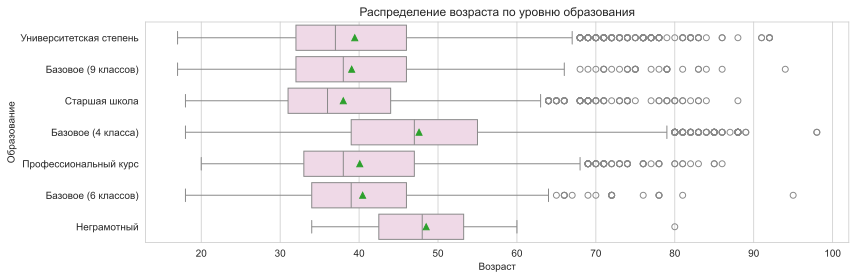

In [25]:
# визуализация: диаграмма ящик с усами
plt.figure(figsize=(12, 4))
sns.boxplot(data=df, y='Образование', x='Возраст', showmeans=True, color='#F3D5E8')
plt.title('Распределение возраста по уровню образования')
plt.tight_layout()
plt.show()

In [26]:
# проверка предпосылок на нормальность и равенство дисперсий (тест Шапиро-Уилка для каждой группы)
education_groups = df['Образование'].unique()
normality_results = {}

print('Проверка нормальности (Shapiro-Wilk, p > 0.05 → нормальное распределение):')
for group in education_groups:
    group_data = df[df['Образование'] == group]['Возраст']
    if len(group_data) < 3:
        print(f"{group}: недостаточно данных")
        continue
    stat, p = shapiro(group_data)
    normality_results[group] = p
    print(f"  {group}: p = {p:.4f}")

# все ли группы нормальны?
all_normal = all(p > 0.05 for p in normality_results.values() if p is not None)

Проверка нормальности (Shapiro-Wilk, p > 0.05 → нормальное распределение):
  Университетская степень: p = 0.0000
  Базовое (9 классов): p = 0.0000
  Старшая школа: p = 0.0000
  Базовое (4 класса): p = 0.0000
  Профессиональный курс: p = 0.0000
  Базовое (6 классов): p = 0.0000
  Неграмотный: p = 0.0382


In [27]:
# проверка равенства дисперсий (Levene)
grouped_data = [df[df['Образование'] == g]['Возраст'].dropna() for g in education_groups if df[df['Образование'] == g]['Возраст'].notna().sum() >= 2]
if len(grouped_data) < 2:
    raise ValueError('Недостаточно групп для сравнения')

stat_levene, p_levene = levene(*grouped_data)
print(f"\nПроверка равенства дисперсий (Levene): p = {p_levene:.4f}")


Проверка равенства дисперсий (Levene): p = 0.0000


In [28]:
# выбор теста и проверка статистической гипотезы
if all_normal and p_levene > 0.05:
    print('\n→ Используем ANOVA (параметрический тест)')
    stat, p = f_oneway(*grouped_data)
    test_name = 'ANOVA'
else:
    print('\n→ Используем Kruskal-Wallis (непараметрический тест)')
    stat, p = kruskal(*grouped_data)
    test_name = 'Kruskal-Wallis'

print(f"\n{test_name} тест: статистика = {stat:.4f}, p-значение = {p:.4f}")

if p < 0.05:
    print('Есть статистически значимая разница в возрасте между группами по уровню образования.')
else:
    print('Нет статистически значимой разницы в возрасте между группами.')


→ Используем Kruskal-Wallis (непараметрический тест)

Kruskal-Wallis тест: статистика = 2238.9445, p-значение = 0.0000
Есть статистически значимая разница в возрасте между группами по уровню образования.


**Вывод:** Датасетом предлагается разделение граждан по 7 группам полученного образования. Данные свидетельствуют о численном превосходстве 2 групп граждан: 1) неграмотные, и 2) граждане с начальным школьным образованием (4 класса).  Средний возраст этих групп составляет 45-59 лет. Это отражает исторический контекст: старшее поколение в исследуемой выборке в большей степени представлено людьми с низким уровнем образования, что может быть связано с особенностями системы образования и доступности образования в середине XX века в стране происхождения данных. В более молодых возрастных когортах (25-40 лет) преобладают клиенты с университетской степенью и профессиональными курсами, что отражает рост доступности высшего образования в последние десятилетия.
<br>Существует статистически значимая связь между уровнем образования и возрастом клиента. Так, p-значение Kruskal-Wallis теста < 0.001 (у нас в исследовании 0.0000), следовательно, нулевая гипотеза отвергается. Это означает, что распределения возраста различаются между группами с разным уровнем образования.
<br>Распределение возраста не является нормальным ни в одной из групп (кроме группы «Неграмотный»). Все p-значения теста Шапиро–Уилка < 0.05 (даже у «Неграмотный» — 0.0382, что всё равно < 0.05), следовательно, нормальность нарушена. Это подтверждает правильность выбора непараметрического теста (Kruskal-Wallis).
<br>Дисперсии возраста между группами также не равны. Levene test: p = 0.0000 свидетельствует о нарушении гомоскедастичности, что дополнительно исключает использование `ANOVA`.
<br>Более высокий уровень образования (например, «Университетская степень») характерен для более молодых клиентов — это объясняется тем, что в последние десятилетия доступ к высшему образованию значительно вырос. Более низкий уровень образования («Базовое (4 класса)», «Неграмотный») характерен для старшего поколения, получившего образование в другие исторические периоды. Это типичная картина для многих стран: с ростом доступности образования доля людей с высшим образованием увеличивается в молодых возрастных когортах.
<br>Уровень образования и возраст клиента статистически связаны: клиенты с разным уровнем образования принадлежат к разным возрастным группам. Эта связь нелинейна и не подчиняется нормальному распределению, поэтому для её описания следует использовать медианы, квартили и непараметрические методы.

<a id=3.6.></a>
### 3.6. Что можно сказать о связи между `длительностью` контакта и `возрастом` клиента? Найдите коэффициент корреляции.

In [29]:
# визуализация: scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='Возраст', y='Длительность', alpha=0.6)
plt.title('Связь между возрастом и длительностью контакта')
plt.xlabel('Возраст')
plt.ylabel('Длительность контакта')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [30]:
# коэффициент корреляции Пирсона (линейная связь)
pearson_corr = df['Возраст'].corr(df['Длительность'], method='pearson')

# коэффициент корреляции Спирмена (монотонная связь)
spearman_corr = df['Возраст'].corr(df['Длительность'], method='spearman')

# вывод результатов
print(f"Коэффициент корреляции Пирсона: {pearson_corr:.4f}")
print(f"Коэффициент корреляции Спирмена: {spearman_corr:.4f}")

# статистическая значимость (p-value)
r_pearson, p_pearson = pearsonr(df['Возраст'], df['Длительность'])
r_spearman, p_spearman = spearmanr(df['Возраст'], df['Длительность'])

print(f"\nПирсон: r = {r_pearson:.4f}, p = {p_pearson:.4e}")
print(f"Спирмен: ρ = {r_spearman:.4f}, p = {p_spearman:.4e}")

Коэффициент корреляции Пирсона: -0.0008
Коэффициент корреляции Спирмена: -0.0020

Пирсон: r = -0.0008, p = 8.6970e-01
Спирмен: ρ = -0.0020, p = 6.8228e-01


**Вывод:** между возрастом клиента и длительностью контакта отсутствует линейная и монотонная связь. Так, коэффициент корреляции Пирсона равен –0.0008, то есть практически нулевой. Это означает, что линейной зависимости между возрастом и длительностью контакта нет. Коэффициент корреляции Спирмена равен –0.0020, то есть также практически нулевой, что говорит об отсутствии даже монотонной (нелинейной, но устойчивой) связи. Оба коэффициента близки к нулю по модулю, и их знак (отрицательный) не имеет практического значения из-за ничтожной величины.
<br>Cтатистическая незначимость полученных p-значений (для Пирсона 0.87 и для Спирмена 0.68) гораздо выше порога 0.05, что означает, что у нас нет оснований отвергать нулевую гипотезу о том, что истинная корреляция в генеральной совокупности равна нулю. Наблюдаемая слабая отрицательная связь может быть вызвана случайным шумом, а не реальной зависимостью.
<br>Подводя итоги вышесказанному, на основании имеющихся данных возраст клиента не влияет на длительность контакта. Знание возраста не помогает предсказать, сколько времени займёт разговор с клиентом. Обе эти переменные можно считать статистически независимыми в контексте линейной и монотонной ассоциации.

<a id=3.7.></a>
### 3.7. Как связаны признаки `образование` и `ипотека`?

Поскольку у нас:
<br> `Образование` — категориальная переменная (например: «Базовое (4 класса)», «Старшая школа и т.д.),
<br> `Ипотека` — бинарная переменная (1 = есть ипотека, 0 = нет),
<br>то для анализа связи нужно:
- посчитать долю клиентов с ипотекой в каждой группе по образованию;
- визуализировать это с помощью столбчатой диаграммы (bar plot);
- проверить статистическую значимость связи с помощью хи-квадрат теста.

Сформулируем гипотезы:
$$
\begin{equation*}
 \begin{cases}
   \text{H}_0 \text{ : распределение наличия ипотеки одинаково во всех группах по уровню образования (т.е. переменные независимы).}
   \\
   \text{H}_1 \text{ : распределение ипотеки отличается в зависимости от образования}
   \\
 \end{cases}
\end{equation*}
$$

Установим пороговое значение: $ \alpha = 0.05$

In [31]:
# расчёт доли клиентов с ипотекой по уровню образования
mortgage_by_edu = df.groupby('Образование')['Ипотека'].agg(
    count='size',
    mortgage_rate='mean'  # среднее = доля единиц (т.к. 0/1)
).reset_index()

mortgage_by_edu['mortgage_rate_pct'] = mortgage_by_edu['mortgage_rate'] * 100

# cортируем по доле ипотеки для наглядности
mortgage_by_edu = mortgage_by_edu.sort_values('mortgage_rate', ascending=False)
mortgage_by_edu

,Образование,count,mortgage_rate,mortgage_rate_pct
4,Профессиональный курс,5240,0.565076,56.507634
3,Неграмотный,18,0.555556,55.555556
6,Университетская степень,13894,0.553836,55.383619
2,Базовое (9 классов),6045,0.546237,54.623656
5,Старшая школа,9512,0.541421,54.142136
1,Базовое (6 классов),2291,0.533392,53.339153
0,Базовое (4 класса),4176,0.531849,53.184866


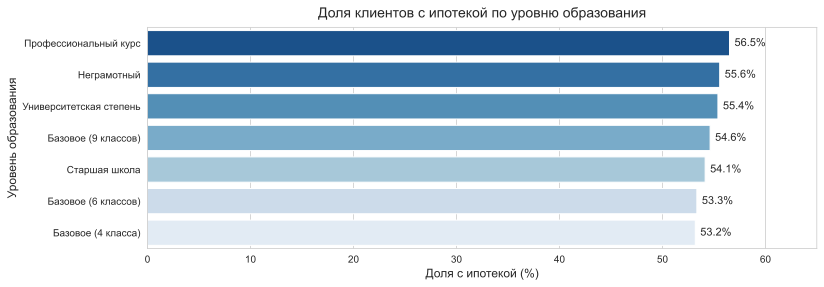

In [32]:
# визуализация: горизонтальная столбчатая диаграмма
plt.figure(figsize=(12, 4))
barplot = sns.barplot(data=mortgage_by_edu, y='Образование', x='mortgage_rate_pct', palette='Blues_r')

for p in barplot.patches:
    width = p.get_width()
    y_center = p.get_y() + p.get_height() / 2
    barplot.annotate(
        f'{width:.1f}%',
        xy=(width, y_center),
        xytext=(5, 0),  # смещение вправо на 5 единиц
        textcoords='offset points',
        ha='left',      # выравнивание текста по левому краю
        va='center',
        fontsize=11,
        fontweight='normal'
    )

plt.title('Доля клиентов с ипотекой по уровню образования', fontsize=14, pad=10)
plt.xlabel('Доля с ипотекой (%)', fontsize=12)
plt.ylabel('Уровень образования', fontsize=12)
plt.xlim(0, mortgage_by_edu['mortgage_rate_pct'].max() * 1.15)  # добавим место для текста
plt.show()

In [33]:
# таблица сопряжённости образования и ипотеки у клиентов
crosstab = pd.crosstab(df['Образование'], df['Ипотека'])
print('Таблица сопряжённости:')
crosstab

Таблица сопряжённости:


Ипотека,0.0,1.0
Образование,,
Базовое (4 класса),1955,2221
Базовое (6 классов),1069,1222
Базовое (9 классов),2743,3302
Неграмотный,8,10
Профессиональный курс,2279,2961
Старшая школа,4362,5150
Университетская степень,6199,7695


In [34]:
# статистический тест: хи-квадрат
chi2, p, dof, expected = chi2_contingency(crosstab)
print(f"\nХи-квадрат = {chi2:.4f}, p-значение = {p:.4f}")

# интерпретация
if p < 0.05:
    print('\nЕсть статистически значимая связь между образованием и наличием ипотеки.')
else:
    print('\nНет статистически значимой связи между образованием и наличием ипотеки.')


Хи-квадрат = 16.1916, p-значение = 0.0128

Есть статистически значимая связь между образованием и наличием ипотеки.


**Вывод:** Из 41 176 граждан более половины, а именно 54,7%, имеют обязательства по выплате ипотечных платежей. Эта тенденция сохраняется и в разрезе образования. Статистическая значимость связи подтверждена. p-значение = 0.0128 < 0.05, нулевая гипотеза отвергается. Это означает, что связь между уровнем образования и наличием ипотеки в представленных данных не является случайной. Так как p = 0.0128, вероятность наблюдать такие (или более экстремальные) различия при истинной независимости переменных составляет всего 1.28%, что считается достаточно малой для принятия альтернативной гипотезы.
<br>Сила связи между переменными — умеренная. Статистика хи-квадрат равна 16.1916 при числе степеней свободы, зависящем от количества категорий образования (например, при 7 уровнях образования — df = (7–1)×(2–1) = 6).
<br>Таким образом, между уровнем образования и наличием ипотеки существует статистически значимая связь (χ² = 16.19, p = 0.013). Это позволяет утверждать, что распределение ипотечных клиентов неравномерно по группам образования.

<a id=4></a>
## Шаг 4. Постройте прогнозную модель вероятности оформления срочного вклада клиентом

Применение модели `Random Forest` учитывает особенности имеющихся данных:
- `Месяц` и `День недели` переведены в числовые признаки;
- все категориальные признаки корректно закодированы;
- учтён дисбаланс классов через `class_weight='balanced'`;
- присутствует оценка качества прогнозной модели и топ-10 важных признаков.

<a id=4.1.></a>
### 4.1. Подготовка данных и определение признаков

Признак `Длительность` сильно влияет на целевую переменную `y`, поскольку `длительность` контакта = `0`, то `y` = `0`. Тем не менее, длительность контакта не известна до созвона. После созвона целевая переменная `y`, очевидно, может измениться. Таким образом, эти входные данные могут быть включены только для исследовательского анализа и должны быть отброшены, если мы хотим получить реалистичную прогнозную модель.

In [35]:
# работаем с копией
dfcopy = df.copy()  

# кодируем категориальные признаки в числовые
dfcopy = dfcopy.replace({'Месяц' : {'Март':3, 'Апрель':4, 'Май':5, 'Июнь':6, 'Июль':7, 'Август':8, 'Сентябрь':9, 'Октябрь':10, 'Ноябрь':11, 'Декабрь':12}})
dfcopy = dfcopy.replace({'День недели' : {'Понедельник':1, 'Вторник':2, 'Среда':3, 'Четверг':4, 'Пятница':5}})

# целевой признак
target = 'y'

# числовые признаки
numeric_features = [
    'Возраст', 'Ипотека', 'Займ',
    'Кампания', 'Предыдущий контакт', 'Доходность',
    'Колебание уровня безработицы', 'Индекс потребительских цен',
    'Индекс потребительской уверенности', 'Европейская межбанковская ставка',
    'Количество сотрудников в компании', 'Месяц', 'День недели']

# категориальные признаки
categorical_features = ['Работа', 'Семейный статус', 'Образование', 'Контакт']

# выделяем X и y
X = dfcopy[numeric_features + categorical_features]
y = dfcopy[target]

<a id=4.2.></a>
### 4.2. Разделение на `train` / `test`

In [36]:
# разделение на train/test выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

<a id=4.3.></a>
### 4.3. Предобработка и построение модели

In [37]:
# предобработка данных
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), categorical_features)])

In [38]:
# модель: Случайный лес с учётом дисбаланса в целевом признаке
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=200,
        max_depth=10,
        min_samples_split=20,
        min_samples_leaf=10,
        class_weight='balanced',  # добавляем ключевой параметр для несбалансированных данных
        random_state=42,
        n_jobs=-1
    ))
])

<a id=4.4.></a>
### 4.4. Обучение модели

In [39]:
# обучение модели
model.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocessor', ...), ('classifier', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...)]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transforme

<a id=4.5.></a>
### 4.5. Оценка качества модели

In [40]:
# оценка качества модели
y_proba = model.predict_proba(X_test)[:, 1]
y_pred = model.predict(X_test)

print(f"ROC-AUC: {roc_auc_score(y_test, y_proba):.4f}\n")
print('Classification Report:')
print(classification_report(y_test, y_pred))

ROC-AUC: 0.8167

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.89      0.92      7308
           1       0.42      0.64      0.51       928

    accuracy                           0.86      8236
   macro avg       0.69      0.76      0.71      8236
weighted avg       0.89      0.86      0.87      8236



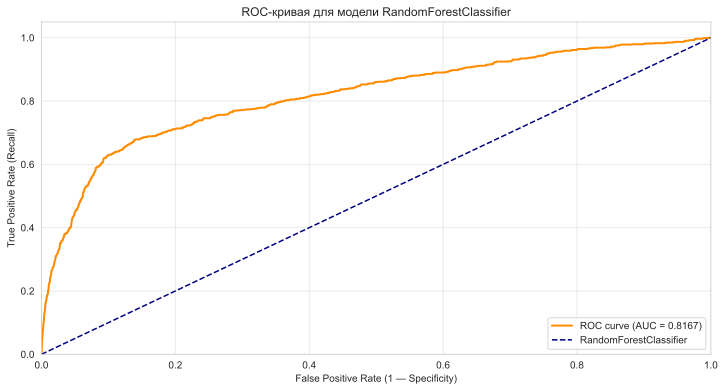

In [41]:
# ROC-кривая - это основная метрика для вероятностных моделей
# получение данных
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

# визуализация: AUC-ROC кривая
plt.figure(figsize=(12, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc_score(y_test, y_proba):.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=1.5, linestyle='--', label='RandomForestClassifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 — Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC-кривая для модели RandomForestClassifier')
plt.legend(loc='lower right')
plt.grid(alpha=0.5)
plt.show()

<a id=4.6.></a>
### 4.6. Матрица ошибок

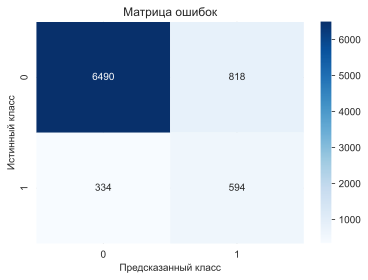

In [42]:
# визуализация: тепловая карта матрицы ошибок
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.title('Матрица ошибок')
plt.ylabel('Истинный класс')
plt.xlabel('Предсказанный класс')
plt.show()

<a id=4.7.></a>
### 4.7. Градация важности признаков

In [43]:
# установление градации важности признаков
# получаем имена признаков после `OneHotEncoding`
preprocessor_fitted = model.named_steps['preprocessor']
try:
    feature_names = preprocessor_fitted.get_feature_names_out()
except AttributeError:
    # для старых версий sklearn
    num_names = numeric_features
    cat_names = preprocessor_fitted.named_transformers_['cat'].get_feature_names_out(categorical_features)
    feature_names = np.concatenate([num_names, cat_names])

# важность от `Random Forest`
importances = model.named_steps['classifier'].feature_importances_

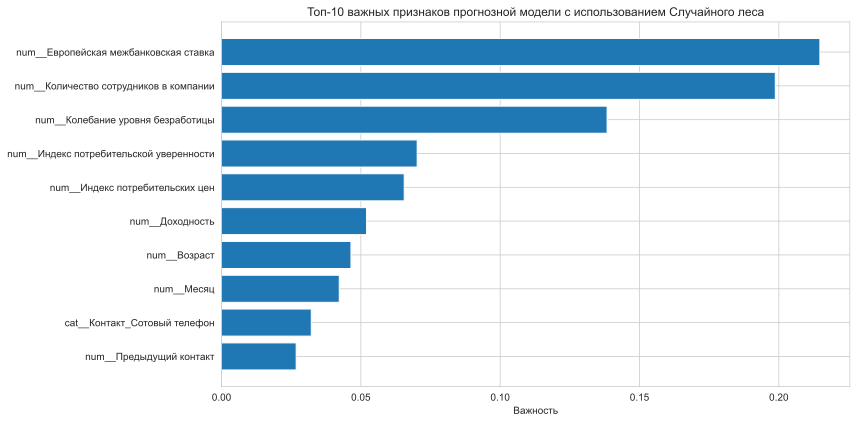

In [44]:
# топ-10 важных признаков для прогнозирования целевого признака
indices = np.argsort(importances)[::-1][:10]
plt.figure(figsize=(12, 6))
plt.title('Топ-10 важных признаков прогнозной модели с использованием Случайного леса')
plt.barh(range(10), importances[indices][::-1], align='center')
plt.yticks(range(10), [feature_names[i] for i in indices][::-1])
plt.xlabel('Важность')
plt.tight_layout()
plt.show()

<a id=4.8.></a>
### 4.8. Пример прогнозирования оформления срочного вклада новым клиентом

In [45]:
# пример нового клиента
new_client = pd.DataFrame([{
    'Возраст': 35,
    'Работа': 'Менеджер',
    'Семейный статус': 'Женат / замужем',
    'Образование': 'Университетская степень',
    'Кредитный дефолт': 0,
    'Ипотека': 0,
    'Займ': 0,
    'Контакт': 'Сотовый телефон',
    'Месяц': 3,
    'День недели': 1,
    'Кампания': 2,
    'Предыдущий контакт': 3,
    'Доходность': 1,
    'Колебание уровня безработицы': 1.2,
    'Индекс потребительских цен': 93.5,
    'Индекс потребительской уверенности': -50.0,
    'Европейская межбанковская ставка': 0.634,
    'Количество сотрудников в компании': 5200
}])

# прогноз вероятности оформления срочного депозита
prob = model.predict_proba(new_client)[0, 1]
print(f"\nВероятность оформления срочного вклада: {prob:.2%}")


Вероятность оформления срочного вклада: 61.88%


<a id=5></a>
## Шаг 5. Вывод

<br>Данный проект посвящён исследованию и прогнозированию поведения клиентов банка с целью повышения вероятности оформления ими срочного вклада. В основе работы лежит датасет, содержащий информацию о более чем 41 тысяче клиентов по 21 признаку — от демографических характеристик (возраст, семейный статус, образование) и финансового поведения (наличие кредита, ипотеки, займа) до деталей маркетинговых контактов (длительность разговора, день недели, месяц) и макроэкономических показателей (уровень безработицы, индексы потребительских цен и уверенности, межбанковская ставка). Проект сочетает в себе элементы разведочного анализа данных, визуализации и прикладного машинного обучения, демонстрируя, как банк может использовать имеющиеся клиентские и макроэкономические данные для более эффективного таргетирования маркетинговых кампаний и повышения конверсии в финансовые продукты.  
<br>На первом этапе проведена тщательная предварительная обработка данных: удалены дубликаты, приведены к согласованным категориям смысловые значения, а также обработаны пропущенные или неопределённые значения (например, «Неизвестно»). Далее выполнена серия исследовательских задач — от простых описательных статистик (средний возраст незамужних клиентов) до визуального и корреляционного анализа связей между признаками: влияет ли кредитный дефолт на решение о вкладе, как связаны образование и наличие ипотеки, существует ли зависимость между возрастом и длительностью телефонного контакта.   
<br>Завершающим этапом стало построение прогностической модели с использованием методов машинного обучения. После кодирования категориальных признаков и разделения данных на обучающую и тестовую выборки была обучена модель классификации, способная оценивать вероятность того, что новый клиент оформит срочный вклад. Качество модели оценено с помощью метрик классификации, матрицы ошибок и анализа важности признаков, что позволило не только достичь предсказательной точности, но и выявить факторы, наиболее сильно влияющие на решение клиента.